# Exploration of high-dimensional analysis of primary cultures spike train data

In [1]:
import numpy as np 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from tqdm import tqdm
import glob

#### Overview of the data

In [2]:
folders = glob.glob('C:\\Users\\bow-lab\\Documents\\Code\\data\\DataXENON\\000*')

files = []

for folder in folders:
    files.append(f'{folder}\\sorted.npz')

data = np.load(files[0], allow_pickle=True)

keys = list(data.keys())

for key in keys:
    content = data[key]
    print(key.ljust(10),
          str(np.shape(content)).ljust(10),
          str(type(content)))
    
units = data['units']
locations = data['locations']
samplerate = int(data['fs'])

units      (136,)     <class 'numpy.ndarray'>
locations  (964, 2)   <class 'numpy.ndarray'>
fs         ()         <class 'numpy.ndarray'>
spike_times (446057,)  <class 'numpy.ndarray'>


In [3]:
units_keys = units[0].keys()

print('Units consists of an array of dictionary with more data', end='\n\n')

for key in units_keys:
    content = units[1][key]
    print(key.ljust(12),
          str(np.shape(content)).ljust(12),
          str(type(content)))

Units consists of an array of dictionary with more data

unit_id      ()           <class 'int'>
spike_train  (7067,)      <class 'numpy.ndarray'>
x_max        ()           <class 'numpy.float64'>
y_max        ()           <class 'numpy.float64'>
template     (81, 964)    <class 'numpy.memmap'>
sorted_index ()           <class 'int'>
max_channel_si ()           <class 'numpy.int32'>
max_channel_id ()           <class 'numpy.str_'>
peak_sign    ()           <class 'str'>
peak_ind     (964,)       <class 'numpy.ndarray'>
amplitudes   (964,)       <class 'numpy.ndarray'>
std_norms    (964,)       <class 'numpy.ndarray'>
electrode    ()           <class 'numpy.int32'>


### Pre-processing the data

Order the data from most to least active unit and obtain the last frame (`total_size`) at which a firing happened, i.e. the total number of frames. 

In [ ]:
def get_total_size(units, sort=True, return_sort=False):
    activity = np.array([])
    total_size = 0

    for unit in units:
        activity = np.append(activity, len(unit['spike_train']))

        try:
            if unit['spike_train'][-1] > total_size:
                total_size = unit['spike_train'][-1]
        except:
            continue
    
    if sort:
        units = units[np.argsort(-1*activity)]

    if return_sort:
        return total_size, units, np.argsort(-1*activity)

    return total_size, units

total_size, units = get_total_size(units)

Create a binary array of size `(#units, total_size)` with a value `1` if the unit has fired, and `0` if it did not fire. 

In [5]:
def convert_spiketrain_to_binary(units, total_size):

    binary_firings = np.full( (len(units), total_size+1), False, dtype=np.bool_)

    for i, unit in enumerate(units):
        binary_firings[i][unit['spike_train']] = True

    return binary_firings

binary_firings = convert_spiketrain_to_binary(units, total_size)

From this binary array we can obtain the firing rate per frame by summing over all units each time step. Because of the high frame rate this gives a very noisy output. We therefore take a running average. To reduce the amount of data and computation time we take an average every `step` frames. 

In [6]:
firing_rate = np.sum(binary_firings, axis=0) #get firing rate per frame

window_size = 0.02 # seconds
window = samplerate * window_size # window in number of frames
step = window / 20

time = np.arange(0, len(firing_rate)/samplerate, 1/samplerate)

firing_rate_avg = []
time_avg = []

for i in range(0, len(firing_rate), int(step)):

    firing_rate_avg.append(np.sum(firing_rate[i:i+int(window)])/window_size)
    
    time_avg.append(time[i]+window_size)

firing_rate_avg = np.array(firing_rate_avg)
time_avg = np.array(time_avg)


Now we can plot the data

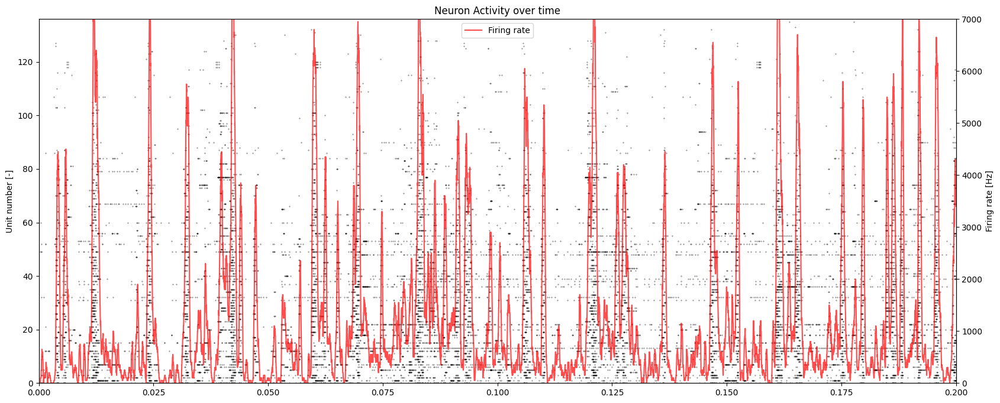

Total measurement time: 5 min 0.038 s


In [8]:
unit_number = np.arange(0, len(units))

fig, ax1 = plt.subplots(figsize=(20, 8))

plt.title('Neuron Activity over time')

for i, unit in enumerate(units):
    ax1.scatter(unit['spike_train']/samplerate/60, 
                np.full_like(unit['spike_train'], unit_number[i]), 
                s=.07, color='k')

ax1.set_ylabel('Unit number [-]')
ax1.set_ylim(0, len(units))

ax2 = ax1.twinx() 
ax2.plot(time_avg/60, firing_rate_avg, c='r', alpha=.7, label='Firing rate')
ax2.set_ylim(0, 7000)
ax2.set_ylabel('Firing rate [Hz]')
ax2.legend()

plt.xlabel('Time [min]')
plt.xlim(0, .2)
plt.show()

print(f'Total measurement time: {int(time[-1]//60)} min {round(time[-1]%60, 3)} s')

# TRY VARIOUS CORRELATION METRICS

In [9]:
from matplotlib.colors import LogNorm
import quantities as pq

from elephant.conversion import BinnedSpikeTrain
from neo.core import SpikeTrain

from elephant.spike_train_correlation import covariance
from elephant.spike_train_correlation import correlation_coefficient as correlation
from elephant.spike_train_correlation import spike_time_tiling_coefficient as sttc
from elephant.spike_train_correlation import spike_time_tiling_coefficient as sttc
from elephant.spike_train_dissimilarity import victor_purpura_distance as vpd
from elephant.spike_train_dissimilarity import van_rossum_distance as vrd
from elephant.spike_train_synchrony import spike_contrast

In [10]:
def convolve_firings(binary_firings,
                     dt = 50,
                     sample_rate = 20000):
    firings_conv = np.zeros_like(binary_firings)
    window = np.ones(int(2*dt*sample_rate/1e3))
    for i, train in tqdm(enumerate(binary_firings)):
        firings_conv[i] = np.clip(np.convolve(train, window, mode='same'), 0, 1)
    return firings_conv


def STTC(binary_firings : np.array,
         dt : float = 50,
         sample_rate : int = 20000,
         firings_conv = None):
    size = np.shape(binary_firings)[0]
    sttc = np.ones((size, size))

    if firings_conv == None:
        firings_conv = convolve_firings(binary_firings, dt, sample_rate)

    T = np.sum(firings_conv, axis=0)/size

    for i in tqdm(range(size)):
        for j in range(i+1, size):
            P_i = np.sum(binary_firings[i] * firings_conv[j])/np.sum(binary_firings[i])
            P_j = np.sum(binary_firings[j] * firings_conv[i])/np.sum(binary_firings[j])

            sttc[i, j] = 1/2 * ( (P_i - T[j]) / (1 - P_i*T[j]) + (P_j - T[i]) / (1 - P_j*T[i]) )
            sttc[j, i] = sttc[i, j]

    return sttc

In [11]:
sttc_result = STTC(binary_firings)

9it [00:07,  1.26it/s]


KeyboardInterrupt: 

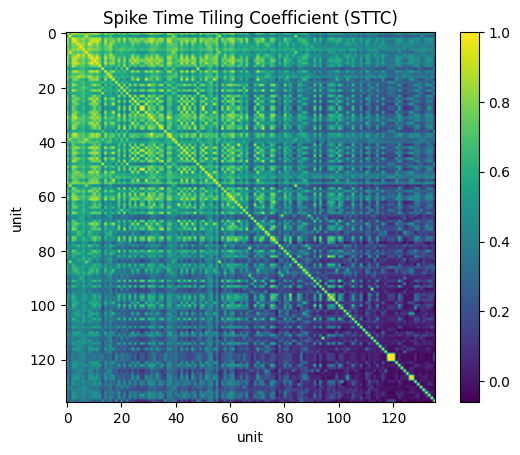

In [11]:
plt.imshow(sttc_result)
plt.title('Spike Time Tiling Coefficient (STTC)')
plt.colorbar()
plt.xlabel('unit')
plt.ylabel('unit')
plt.show()

##### now try on all data

_______file: 000264____________
Preprocessing...
Calculating STTC...


136it [01:38,  1.38it/s]
100%|██████████| 136/136 [01:42<00:00,  1.32it/s]


Plotting...


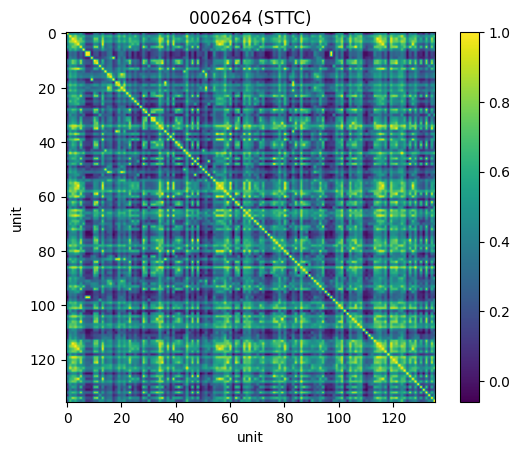

_______file: 000267____________
Preprocessing...
Calculating STTC...


137it [01:57,  1.16it/s]
100%|██████████| 137/137 [01:45<00:00,  1.30it/s]


Plotting...


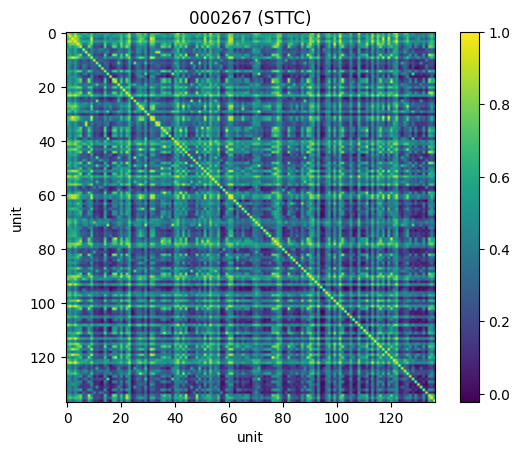

_______file: 000268____________
Preprocessing...
Calculating STTC...


132it [01:53,  1.16it/s]
100%|██████████| 132/132 [01:38<00:00,  1.34it/s]


Plotting...


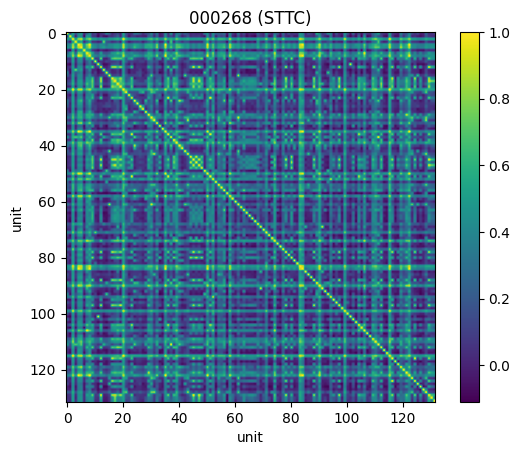

_______file: 000271____________
Preprocessing...
Calculating STTC...


137it [01:40,  1.37it/s]
100%|██████████| 137/137 [01:47<00:00,  1.28it/s]


Plotting...


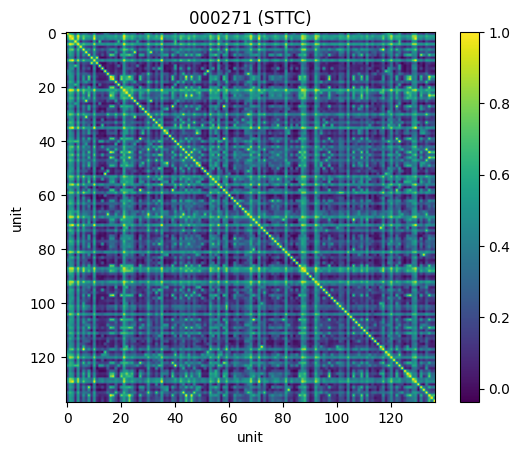

_______file: 000272____________
Preprocessing...
Calculating STTC...


134it [01:37,  1.37it/s]
100%|██████████| 134/134 [01:40<00:00,  1.33it/s]


Plotting...


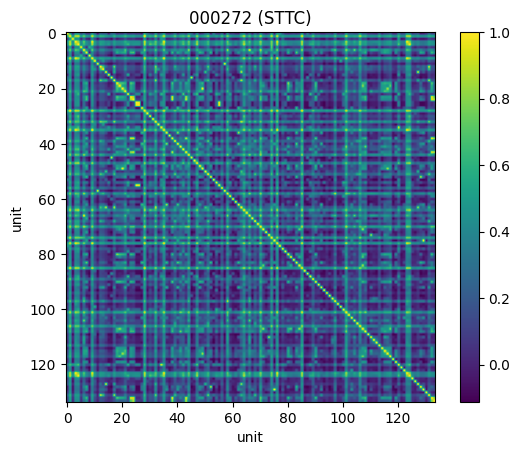

_______file: 000275____________
Preprocessing...
Calculating STTC...


92it [01:19,  1.15it/s]
100%|██████████| 92/92 [00:46<00:00,  1.96it/s]


Plotting...


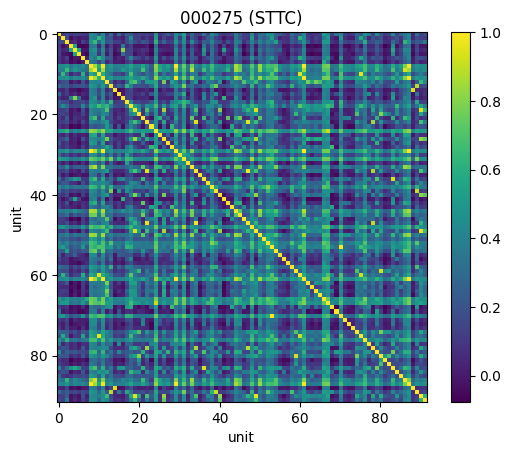

_______file: 000276____________
Preprocessing...
Calculating STTC...


129it [01:34,  1.37it/s]
100%|██████████| 129/129 [01:33<00:00,  1.38it/s]


Plotting...


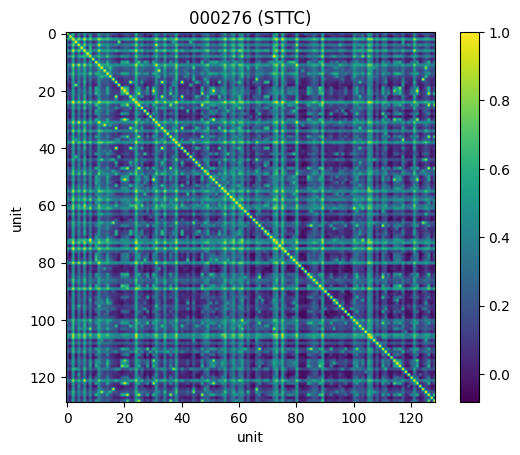

_______file: 000279____________
Preprocessing...
Calculating STTC...


120it [01:27,  1.37it/s]
100%|██████████| 120/120 [01:20<00:00,  1.50it/s]


Plotting...


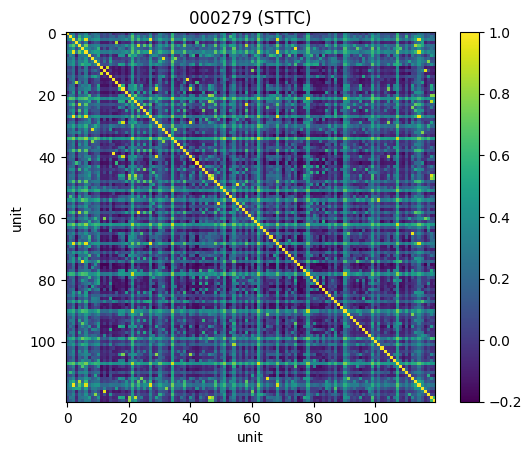

_______file: 000280____________
Preprocessing...
Calculating STTC...


121it [01:28,  1.37it/s]
100%|██████████| 121/121 [01:21<00:00,  1.48it/s]


Plotting...


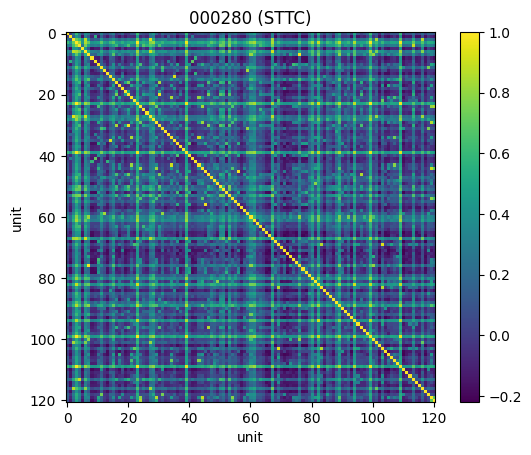

_______file: 000283____________
Preprocessing...
Calculating STTC...


112it [01:21,  1.37it/s]
100%|██████████| 112/112 [01:10<00:00,  1.58it/s]


Plotting...


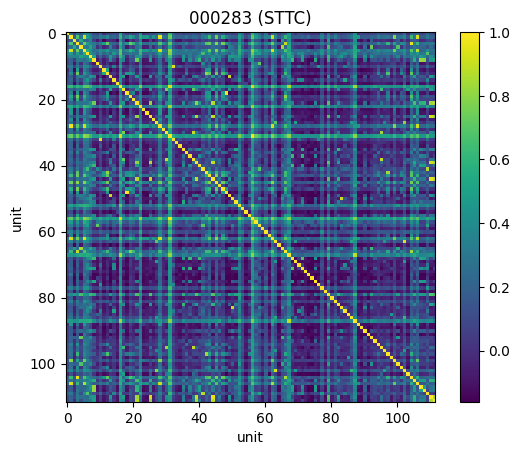

_______file: 000284____________
Preprocessing...
Calculating STTC...


118it [01:26,  1.37it/s]
100%|██████████| 118/118 [01:18<00:00,  1.51it/s]

Plotting...


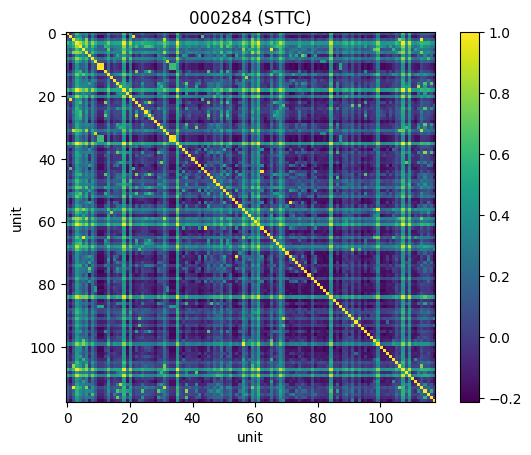

_______file: 000291____________
Preprocessing...
Calculating STTC...


2it [00:01,  1.37it/s]
100%|██████████| 2/2 [00:00<00:00, 141.01it/s]

Plotting...


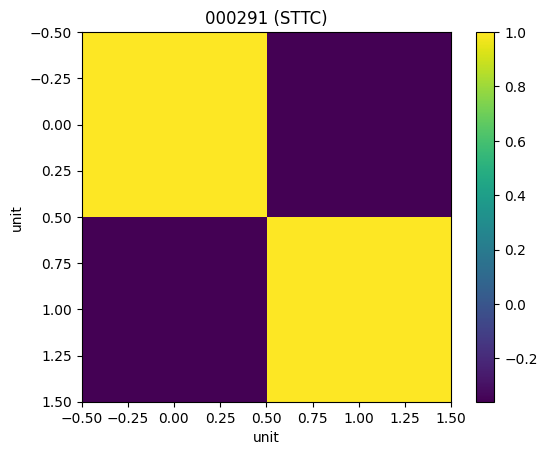

_______file: 000293____________
Preprocessing...
Calculating STTC...


2it [00:01,  1.36it/s]
100%|██████████| 2/2 [00:00<00:00, 145.63it/s]

Plotting...


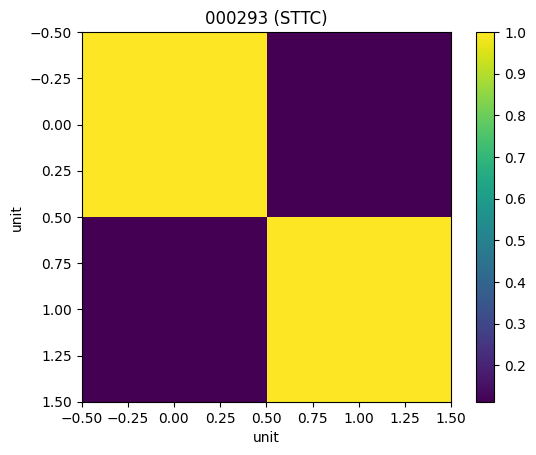

In [23]:
sttc_results = []

for file in files:
    file_nr = file.split('\\')[-2]
    print(f'_______file: {file_nr}____________')

    data = np.load(file, allow_pickle=True)
    units = data['units']

    print('Preprocessing...')
    size, units = get_total_size(units, sort=False)
    binary_firings = convert_spiketrain_to_binary(units, size)

    print('Calculating STTC...')
    sttc_result = STTC(binary_firings)
    sttc_results.append(sttc_result)

    print('Plotting...')
    plt.imshow(sttc_result)
    plt.title(f'{file_nr} (STTC)')
    plt.colorbar()
    plt.xlabel('unit')
    plt.ylabel('unit')
    plt.show()

    

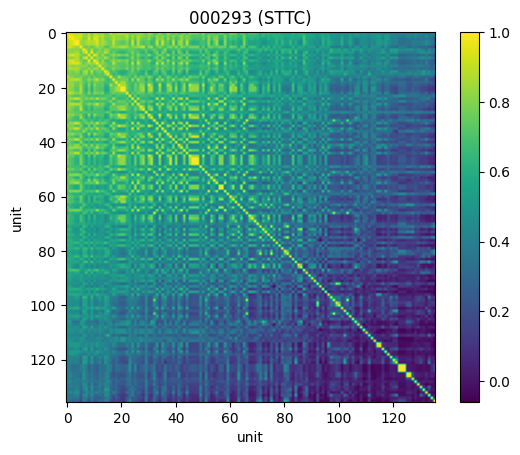

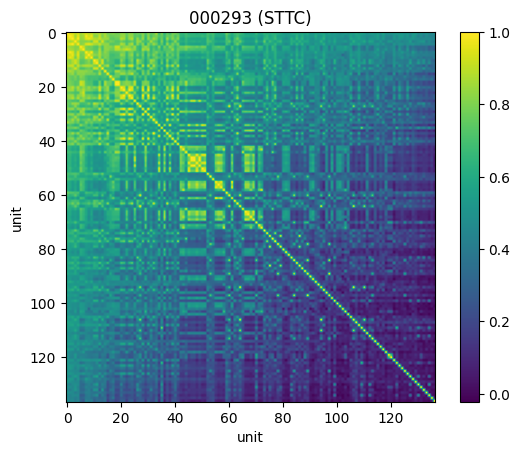

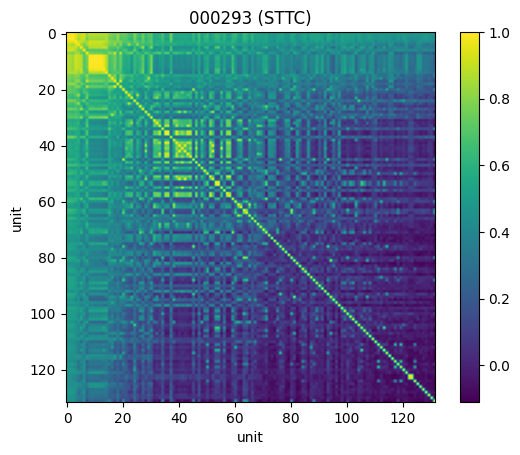

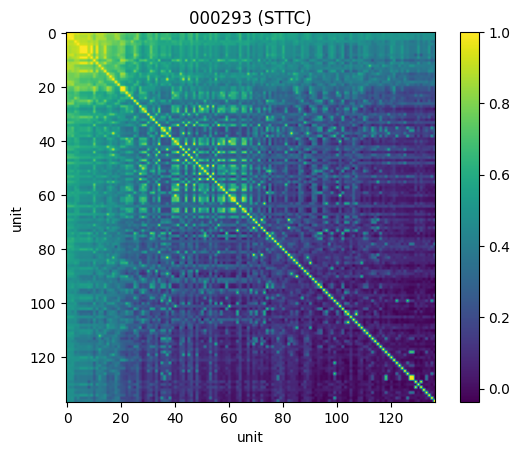

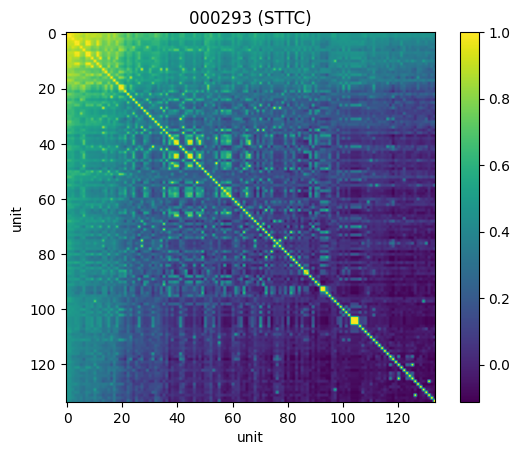

...

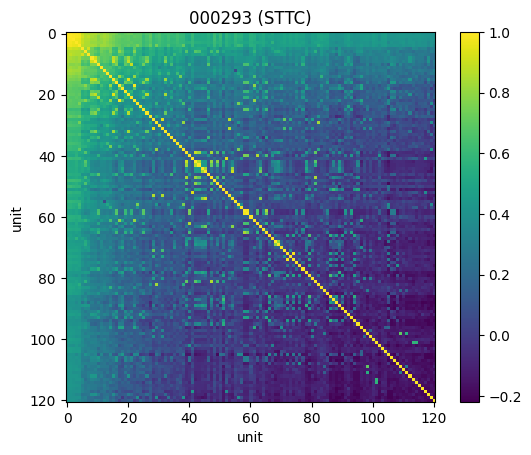

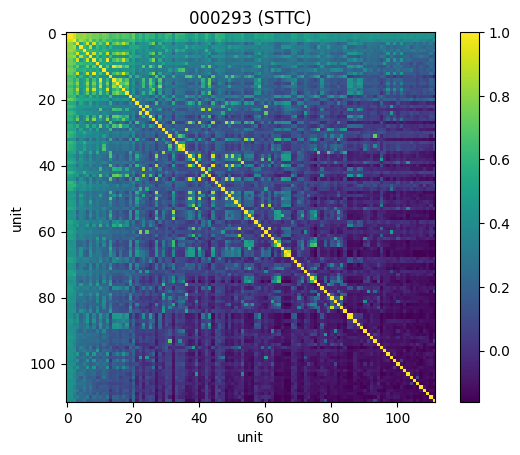

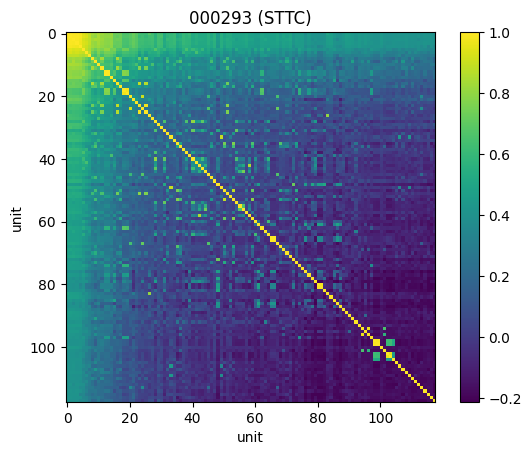

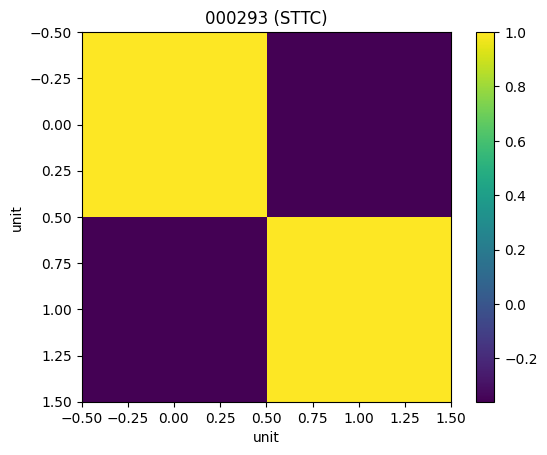

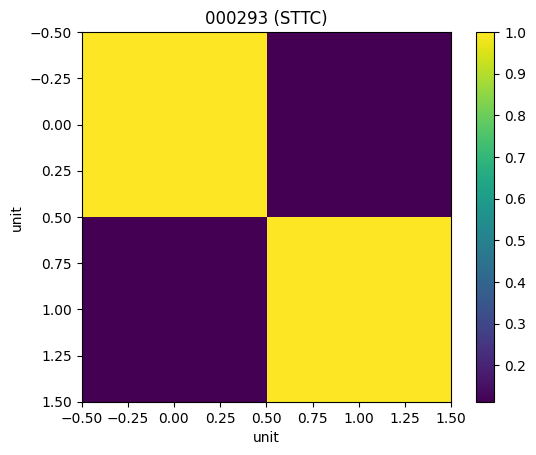

In [24]:
for file, sttc_result in zip(files, sttc_results):
    order = np.argsort(-1*np.sum(sttc_result, axis=1))
    sttc_ordered = sttc_result[order][:,order]

    plt.imshow(sttc_ordered)
    plt.title(f'{file_nr} (STTC)')
    plt.colorbar()
    plt.xlabel('unit')
    plt.ylabel('unit')
    plt.show()

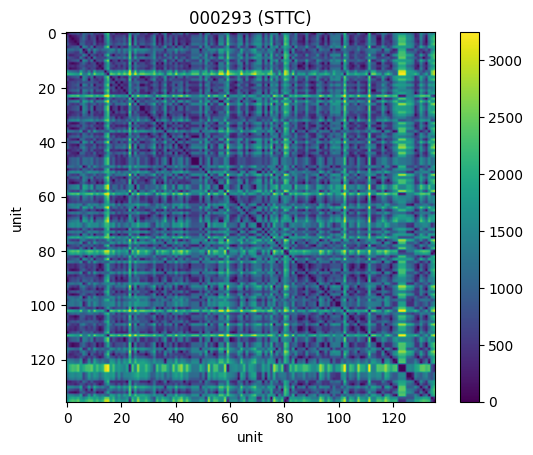

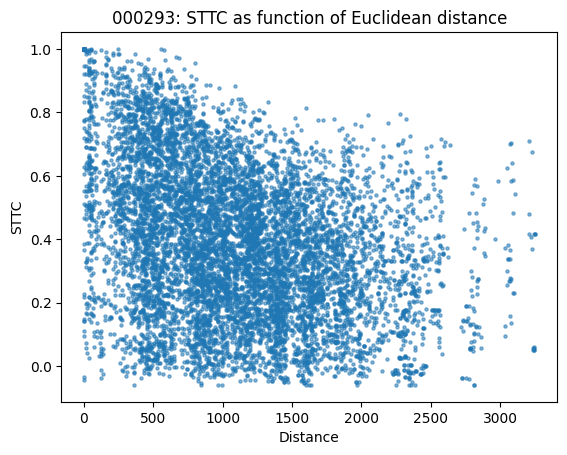

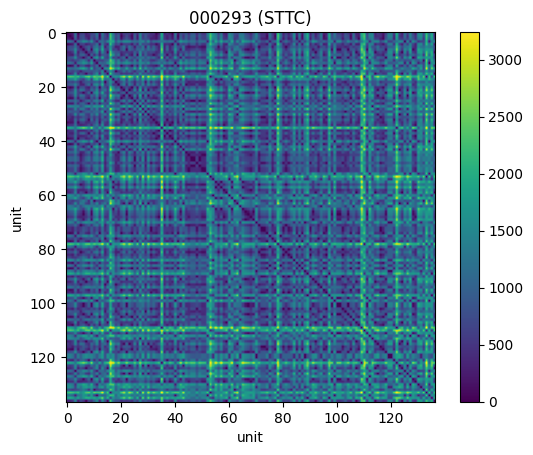

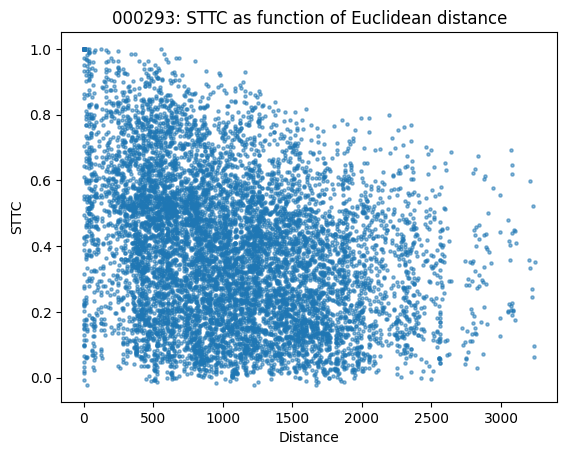

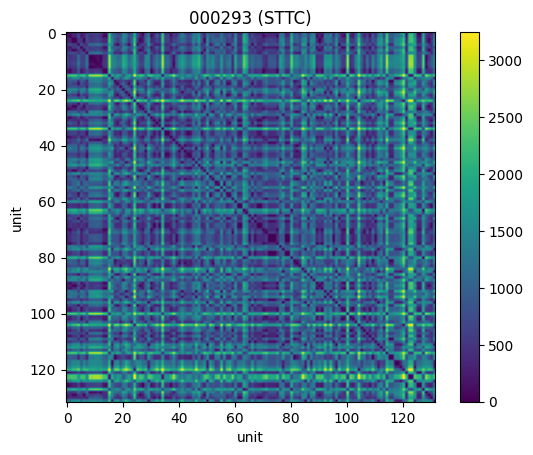

...

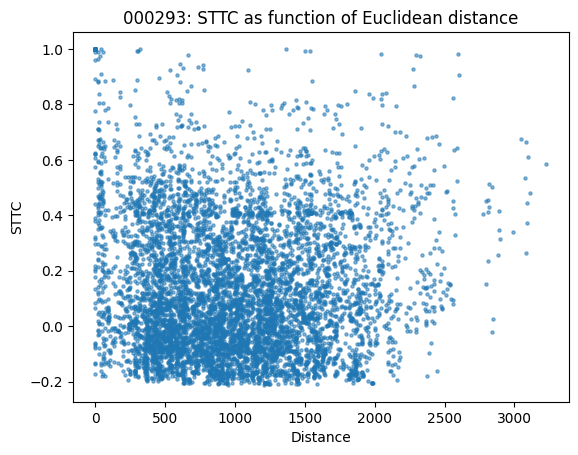

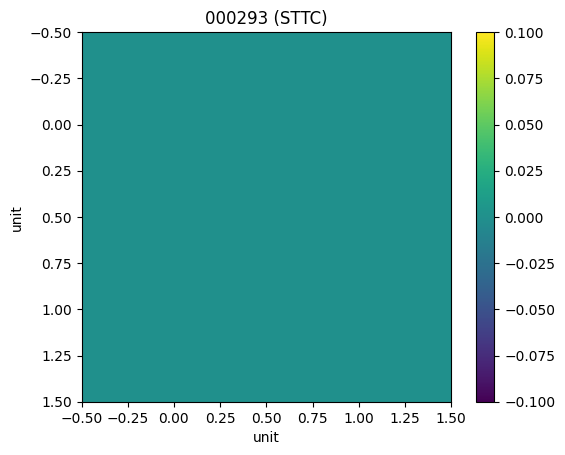

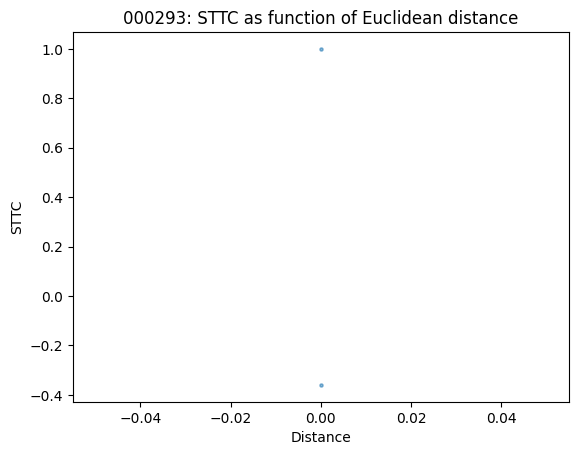

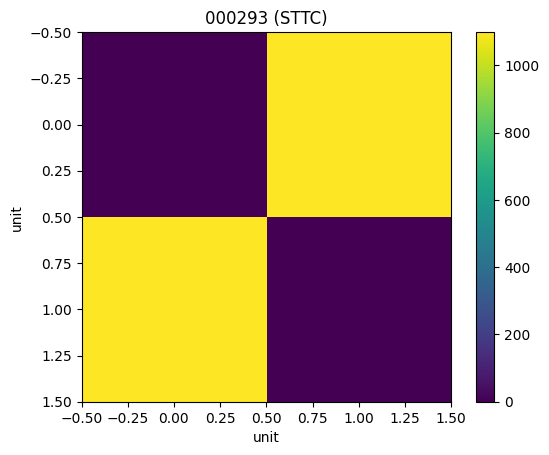

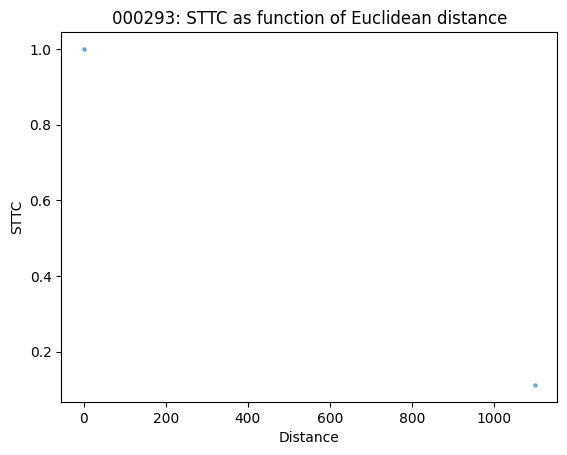

In [35]:
for file, sttc_result in zip(files, sttc_results):
    data = np.load(file, allow_pickle=True)
    units = data['units']

    distances = np.zeros_like(sttc_result)

    for i in range(len(distances)):
        x1, y1 = units[i]['x_max'], units[i]['y_max']
        for j in range(len(distances)):
            if j > i:
                x2, y2 = units[j]['x_max'], units[j]['y_max']
                distance = np.sqrt( (x2-x1)**2 + (y2-y1)**2 )
                distances[i,j] = distance
                distances[j, i] = distance

    order = np.argsort(-1*np.sum(sttc_result, axis=1))
    sttc_ordered = sttc_result[order][:,order]

    plt.imshow(distances[order][:,order])
    plt.title(f'{file_nr} (STTC)')
    plt.colorbar()
    plt.xlabel('unit')
    plt.ylabel('unit')
    plt.show()

    dist_flat = distances.flatten()
    sttc_flat = sttc_result.flatten()

    plt.scatter(distances, sttc_result, s=5, alpha=.3)
    plt.title(f'{file_nr}: STTC as function of Euclidean distance')
    plt.xlabel('Distance')
    plt.ylabel('STTC')
    plt.show()

In [ ]:
for file, sttc_result in zip(files, sttc_results):
    data = np.load(file, allow_pickle=True)
    units = data['units']

    distances = np.zeros_like(sttc_result)

    for i in range(len(distances)):
        x1, y1 = units[i]['x_max'], units[i]['y_max']
        for j in range(len(distances)):
            if j > i:
                x2, y2 = units[j]['x_max'], units[j]['y_max']
                distance = np.sqrt( (x2-x1)**2 + (y2-y1)**2 )
                distances[i,j] = distance
                distances[j, i] = distance


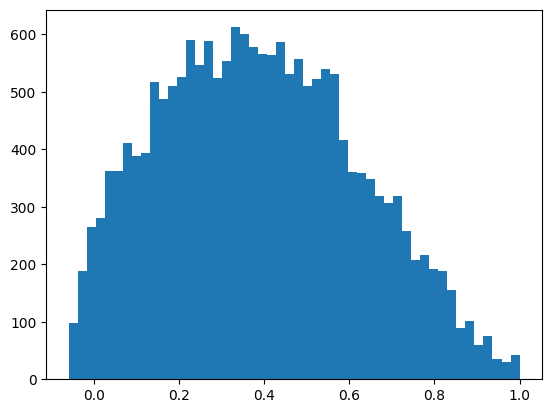

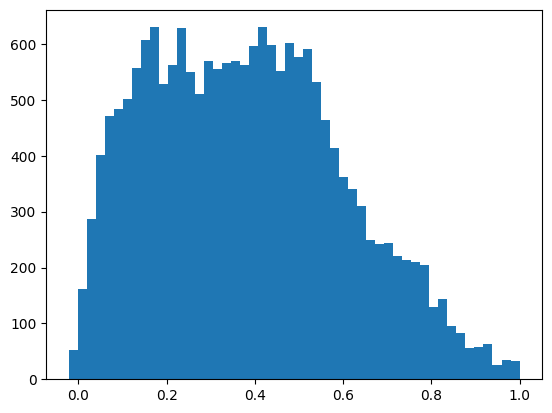

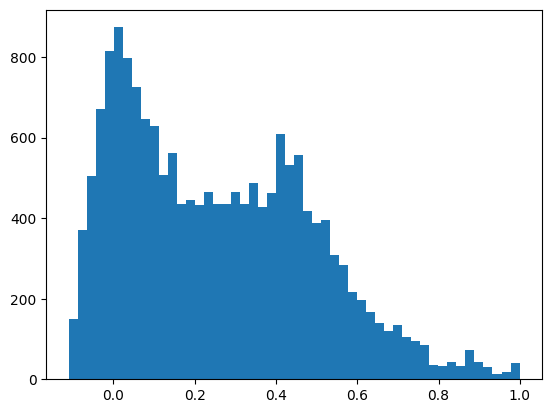

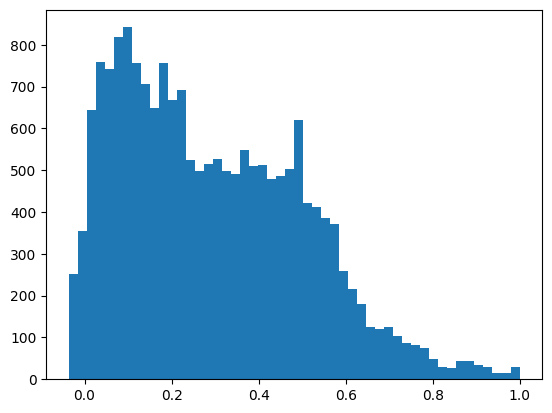

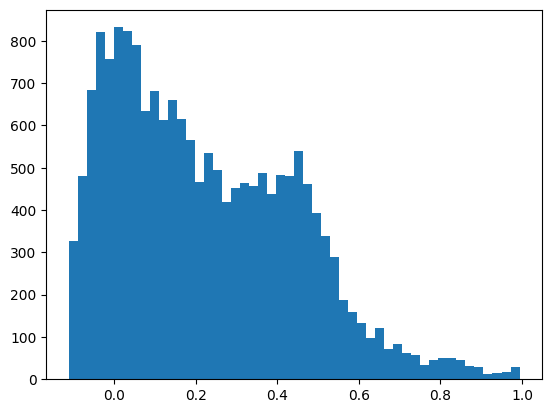

...

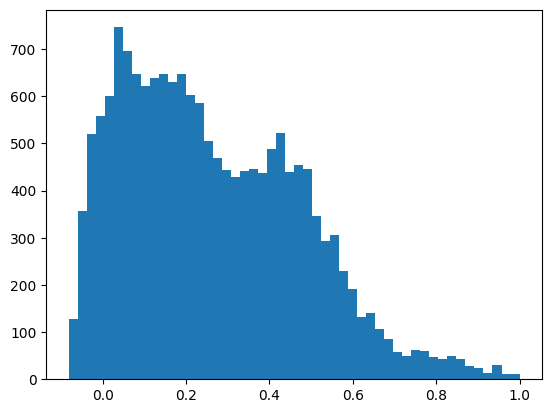

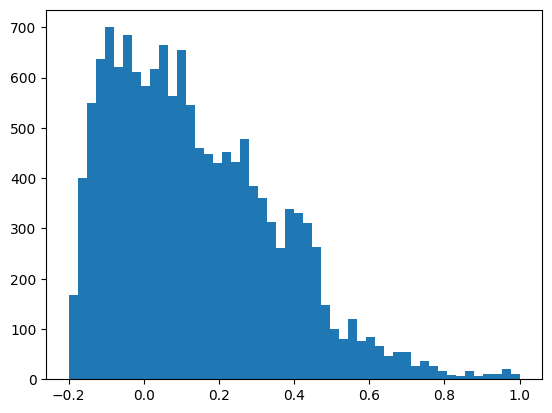

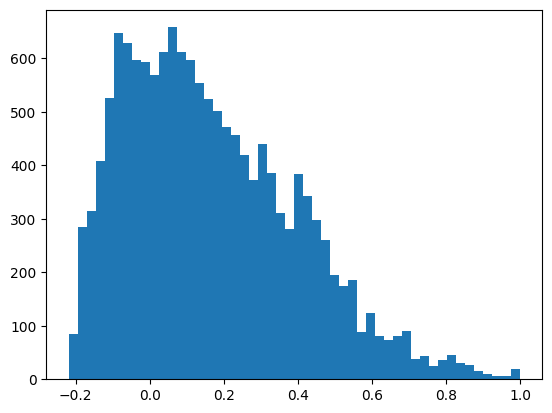

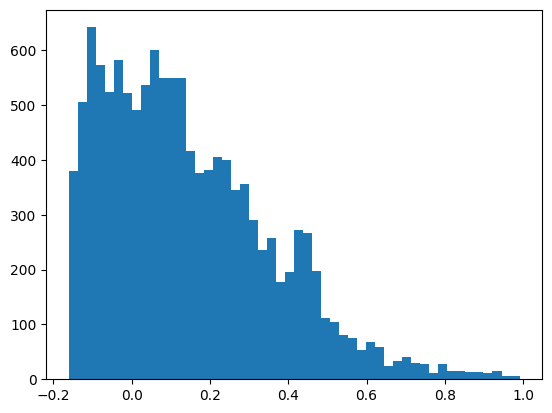

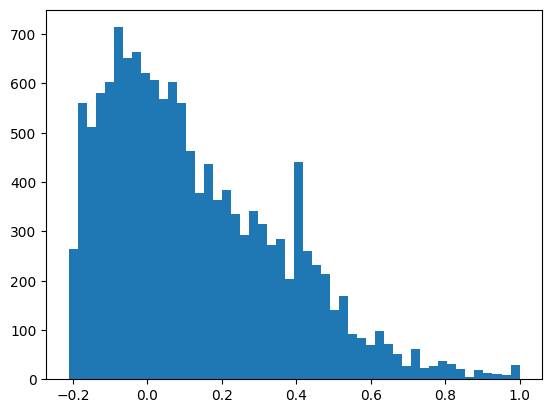

In [33]:
for sttc_result in sttc_results[:-2]:
    diagonal_indices = np.diag_indices_from(sttc_result)
    matrix_no_diag = np.copy(sttc_result)
    matrix_no_diag[diagonal_indices] = np.nan
    flattened = matrix_no_diag.flatten()
    flattened_no_diag = flattened[~np.isnan(flattened)]

    plt.hist(flattened_no_diag, bins=50)
    plt.show()